In [1]:
import numpy as np
import kwant
import kwant.continuum
import pickle
import sympy
import BoundState as bs
import pandas as pd
from sympy.physics.matrices import msigma, Matrix
from sympy import eye
from sympy.physics.quantum import TensorProduct
import Functions as f
import matplotlib.pyplot as plt
import peierls
from sympy.utilities.exceptions import SymPyDeprecationWarning
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=SymPyDeprecationWarning)
from scipy.signal import argrelextrema
def make_3dti(Lx=100,Wy=100,Tz=100,a=10,phase=0.,mu=0.0,flux=0.,Delta=0.,
             params_3DTI=dict(A_perp=3,A_z=3,M_0=0.3,M_perp=15,M_z=15,C_0=0,C_perp=0,C_z=0)):
    ham_3DTI = ("- mu * kron(sigma_z, sigma_0, sigma_0) + "
                "{epsilon} * kron(sigma_z, sigma_0, sigma_0) + "
                "{M} * kron(sigma_z, sigma_0, sigma_z) - "
                "A_perp * k_x * kron(sigma_z, sigma_y, sigma_x) + "
                "A_perp * k_y * kron(sigma_0, sigma_x, sigma_x) + "
                "A_z * k_z * kron(sigma_z, sigma_0, sigma_y)")

    epsilon = "(C_0 - C_perp * (k_x**2 + k_y**2) - C_z * k_z**2)"
    M = "(M_0 - M_perp * (k_x**2 + k_y**2) - M_z * k_z**2)"
    ham_3DTI = ham_3DTI.format(epsilon=epsilon, M=M)
    ham_3DTI = ham_3DTI.format(C_0="C_0")

    SC_complex = ("- re({Delta}) * kron(sigma_y, sigma_y, sigma_0) -"
                  "im({Delta}) * kron(sigma_x, sigma_y, sigma_0)")

    SC_L_final = SC_complex.format(Delta="Deltaf_L(y, z)")
    SC_R_final = SC_complex.format(Delta="Deltaf_R(y, z)")

    ham_3DTI_SC_L = ham_3DTI + SC_L_final # 3D TI BdG Hamiltonian with superconducting pairing potential for left lead
    ham_3DTI_SC_R = ham_3DTI + SC_R_final # 3D TI BdG Hamiltonian with superconducting pairing potential for right lead

    ham_3DTI_discr, coords = kwant.continuum.discretize_symbolic(ham_3DTI)
    ham_3DTI_SC_L_discr, coords = kwant.continuum.discretize_symbolic(ham_3DTI_SC_L)
    ham_3DTI_SC_R_discr, coords = kwant.continuum.discretize_symbolic(ham_3DTI_SC_R)

    vector_potential='[B_y * (z - T_z), -B_x * (z - T_z), 0]'
    signs=[-1, -1, -1, -1, 1, 1, 1, 1] # negative charge for the particles, positive charge for the holes

    ham_3DTI_discr = peierls.apply(ham_3DTI_discr, coords, A=vector_potential, signs=signs)
    ham_3DTI_SC_L_discr = peierls.apply(ham_3DTI_SC_L_discr, coords, A=vector_potential, signs=signs)
    ham_3DTI_SC_R_discr = peierls.apply(ham_3DTI_SC_R_discr, coords, A=vector_potential, signs=signs)

    a = a
    temp_syst = kwant.continuum.build_discretized(ham_3DTI_discr, coords, grid=a)
    temp_lead_L = kwant.continuum.build_discretized(ham_3DTI_SC_L_discr, coords, grid=a)
    temp_lead_R = kwant.continuum.build_discretized(ham_3DTI_SC_R_discr, coords, grid=a)

    def get_shape(L, W, T):
        L_start, W_start, T_start = 0, 0, 0
        L_stop, W_stop, T_stop = L, W, T

        def shape(site):
            (x, y, z) = site.pos
            return (W_start <= y <= W_stop and
                    T_start <= z <= T_stop and
                    L_start <= x <= L_stop)

        return shape, np.array([L_stop, W_stop, T_stop])

    L_x = Lx
    W_y = Wy
    T_z = Tz

    syst = kwant.Builder()
    _ = syst.fill(temp_syst, *get_shape(L_x, W_y, T_z))
    lat = kwant.lattice.cubic(a, norbs=8)

    lead_L = kwant.Builder(kwant.TranslationalSymmetry((-a, 0, 0)))
    lead_R = kwant.Builder(kwant.TranslationalSymmetry((a, 0, 0)))

    lead_L.fill(temp_lead_L, *get_shape(L_x, W_y, T_z))
    lead_R.fill(temp_lead_R, *get_shape(L_x, W_y, T_z))
    syst.attach_lead(lead_L)
    syst.attach_lead(lead_R)

    fsyst = syst.finalized()

    f = dict(
        re=lambda x: x.real,
        im=lambda x: x.imag,
        phi_0=1.0, # units with flux quantum equal to 1
        exp=np.exp
    )
    
    params_3DTI = params_3DTI
    
    params_JJ = dict(
        a = a,
        L_x=L_x,
        W_y=W_y,
        T_z=T_z,
        mu = mu,
        B_x = flux/W_y/T_z,
        B_y = 0,
        Deltaf_L = lambda y, z: Delta if z==T_z else 0,
        Deltaf_R = lambda y, z: Delta*np.exp(1j*phase) if z==T_z else 0)
    
    params_bands = dict(
        **f,
        **params_3DTI,
        **params_JJ
    )

    return fsyst, params_bands
def orbital_probability(data,orbital,solution):
    current=data.copy()
    solns=current.shape[1]
    test=np.reshape(current,(11,11,11,8,solns))
    x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')
    c=test[:,:,:,orbital,solution]
    c_amp=c*np.conj(c)
    return np.sum(test[:,:,:,orbital,solution]*np.conj(test[:,:,:,orbital,solution]))
    
def plot_3DTI_wavefunc(data,orbital,solution,normalise=False, save=False,name=''):
    '''
    data - wavefunction returned by the boundstate algorithm
    orbital - orbital number. ranges from 0 to 7
    solution - solution number. generally 0 or 1
    normalise - if true, divide all values by phase of site [0,0,0]
    save - duh
    name - file name for graph
    
    Returns a plot of imaginary, real, and psi^2 for the orbital
    and prints a value for total scattering region probability.
    '''

    current=data.copy()
    solns=current.shape[1]
    orbitals=8
    test=np.reshape(current,(11,11,11,orbitals,solns))
    x,y,z=np.meshgrid(range(11),range(11),range(11),indexing='ij')
    c=test[:,:,:,orbital,solution]
    
    if normalise:
        c/=np.exp(1j*np.angle(c[0, 0, 0]))
        
    c_r=np.real(c)
    c_i=np.imag(c)
    c_amp=c*np.conj(c)
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,subplot_kw=dict(projection='3d'))

    #fig,ax=plt.subplots(1,1,subplot_kw=dict(projection='3d'))
    ax1.set_title('Re')
    ax2.set_title('Im')
    ax3.set_title('Square')

    img=ax1.scatter(x, y, z, c=c_r,cmap='seismic',vmin=-0.015,vmax=0.015)
    img2=ax2.scatter(x, y, z, c=c_i,cmap='seismic',vmin=-0.015,vmax=0.015)
    img3=ax3.scatter(x, y, z, c=c_amp,cmap='binary',vmin=0,vmax=0.001)

    fig.colorbar(img,ax=ax1, pad=.2, aspect=10,orientation='horizontal')
    fig.colorbar(img2,ax=ax2, pad=.2, aspect=10,orientation='horizontal')
    fig.colorbar(img3,ax=ax3, pad=.2, aspect=10,orientation='horizontal')

    if save:
        plt.savefig(filename)

    plt.show()
    print('Total probability:',np.sum([np.sum(test[:,:,:,i,solution]*np.conj(test[:,:,:,i,solution])) for i in range(8)]))
    print('Orbital probability:',np.sum(test[:,:,:,orbital,solution]*np.conj(test[:,:,:,orbital,solution])))
    
def plot_ephase(x,y,pi=2,s=5,label=''):
    plt.scatter(x,y,s=s,label=label)
    plt.ylabel(r'E/$\Delta$')
    plt.xlabel('$\phi$')
    if pi==2:
        plt.xticks(np.linspace(0,2*np.pi,5,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$'])
    elif pi==4:
        plt.xticks(np.linspace(0,4*np.pi,9,endpoint=True), ['0',r'$\frac{\pi}{2}$',r'$\pi$',
                                                     r'$\frac{3\pi}{2}$',r'$2\pi$',
                                                     r'$\frac{5\pi}{2}$',r'$3\pi$',
                                                     r'$\frac{7\pi}{2}$',r'$4\pi$'])
        
def fourier_reconstruct(intery,interx,modes=10,odd=False):
    '''
    Returns the reconstructed y-values given the fourier modes and original x-values
    If odd, returns graph constructed from only odd modes.
    Assumes
    '''
    coeff=f.fourier_decompose(intery,interx,modes=modes,offset=False)
    if odd:
        odd_modes=coeff[::2]
        recon=[sum([odd_modes[j]*np.cos(x/2*(2*j+1)) for j in range(len(odd_modes))]) for x in interx]
    else:
        recon=[sum([coeff[j]*np.cos(x/2*(j+1)) for j in range(len(coeff))]) for x in interx]
    return recon
    

In [13]:
params_model=dict(A_perp=3,A_z=3,M_0=0.3,M_perp=15,M_z=15,C_0=0,C_perp=0,C_z=0)
syst,band_params=make_3dti(params_3DTI=params_model,mu=0.02,Delta=0.01)
flux_arr=np.linspace(0,1,11)
momenta=np.linspace(-0.5,0.5,121)
saved_bands=10 #save only 10 positive bands. by PH sym, we get -ve for free

energies=np.ones((11,121,saved_bands))
for i in range(len(flux_arr)):
    band_params.update(B_x = flux_arr[i]/100/100)
    bands=kwant.physics.dispersion.Bands(syst.leads[0],params=band_params)
    en=np.array([bands(x) for x in momenta])
    lngth=en.shape[1]
    save_index=int(lngth/2)
    energies[i,:,:]=en[:,save_index:save_index+saved_bands]
    print(i,'done')


0 done
1 done
2 done
3 done
4 done
5 done
6 done
7 done
8 done
9 done
10 done


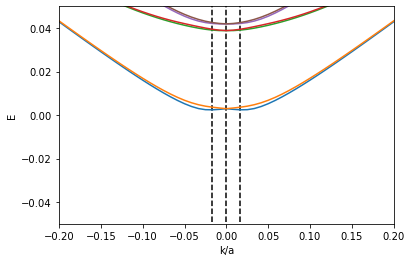

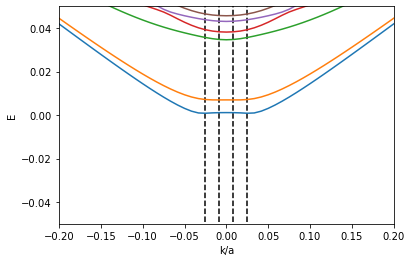

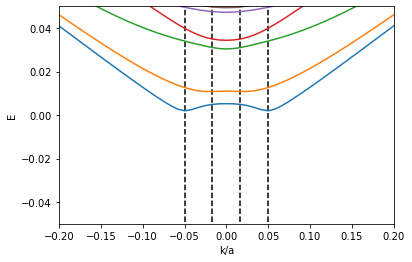

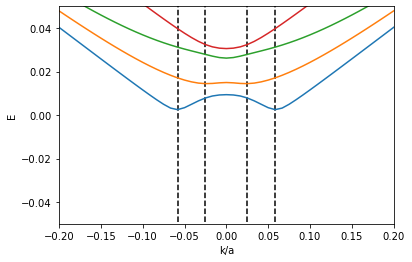

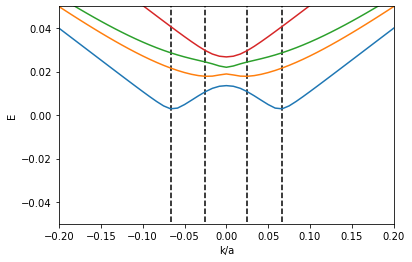

...

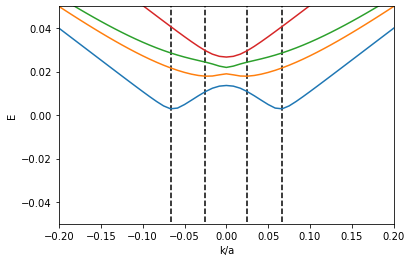

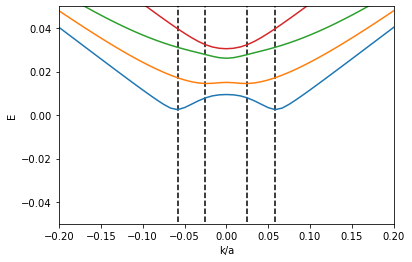

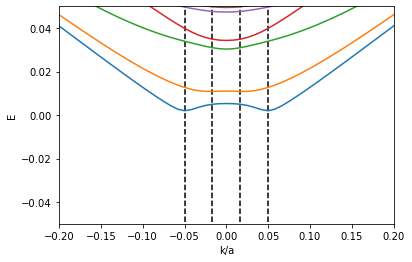

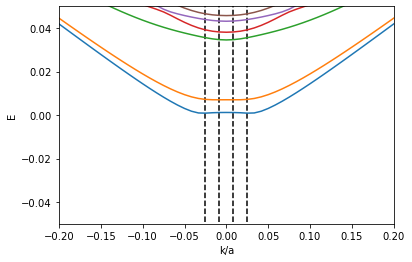

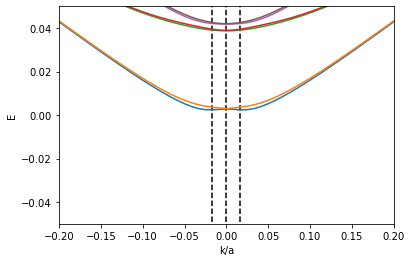

In [15]:
from scipy.signal import argrelextrema


#find minima
flux_arr=np.linspace(0,1,11)
momenta=np.linspace(-0.5,0.5,121)
for i in range(len(flux_arr)):
    
    plt.figure()
    ylim=0.05
    xlim=0.2
    plt.plot(momenta,energies[i])
    for j in range(2):
        plt.vlines(momenta[argrelextrema(energies[i,:,j],np.less)],-1,1,linestyles='dashed')
    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.xlim(-xlim,xlim)
    plt.ylim(-ylim,ylim)
    
    

In [16]:
mu_arr=np.linspace(0.,0.1,101)
mu_arr

array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017,
       0.018, 0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026,
       0.027, 0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035,
       0.036, 0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044,
       0.045, 0.046, 0.047, 0.048, 0.049, 0.05 , 0.051, 0.052, 0.053,
       0.054, 0.055, 0.056, 0.057, 0.058, 0.059, 0.06 , 0.061, 0.062,
       0.063, 0.064, 0.065, 0.066, 0.067, 0.068, 0.069, 0.07 , 0.071,
       0.072, 0.073, 0.074, 0.075, 0.076, 0.077, 0.078, 0.079, 0.08 ,
       0.081, 0.082, 0.083, 0.084, 0.085, 0.086, 0.087, 0.088, 0.089,
       0.09 , 0.091, 0.092, 0.093, 0.094, 0.095, 0.096, 0.097, 0.098,
       0.099, 0.1  ])

# Flux Anisotropy

In [16]:
'''
Delta = 0. #no delta, we want to investigate periodicity of the bands only.
Az_arr=np.linspace(0.3,4.3,101)
flux_arr=np.linspace(0,2,101)
saved_bands=15 #as long as its not 900, we're good
momenta=np.linspace(-0.3,0.3,61)
elements=len(flux_arr)*len(Az_arr)
arr_ind = int(os.environ['PBS_ARRAY_INDEX'])
jobs=24

file_name='3dti_Az_flux_periodicity'
perjob=elements//jobs+1
print(perjob)
counter=0
savefile=[]
for i in range(len(flux_arr)):
    for j in range(len(Az_arr)):
        counter+=1
        if (arr_ind*perjob)<counter<=((arr_ind+1)*perjob):
            loop_band=params_bands.copy()
            loop_band.update(
                 B_x = flux_arr[i]/W_y/T_z,
                 A_z=Az_arr[j])
                
            bands=kwant.physics.dispersion.Bands(fsyst.leads[0],params=loop_band)
            en=np.array([bands(k) for k in momenta])
            lngth=en.shape[1]
            save_index=int(lngth/2)
            savefile.append([i,j,en[:,save_index:save_index+saved_bands]])

pickle.dump(savefile, open('./anisotropy/'+file_name+'%s' % (str(arr_ind)), 'wb'))
'''
#loading data
Az_arr=np.linspace(0.3,4.3,101)
flux_arr=np.linspace(0,2,101)
momenta=np.linspace(-0.3,0.3,61)
saved_bands=15
en_arr=np.ones((len(flux_arr),len(Az_arr),len(momenta),saved_bands))
total_jobs=24
for k in range(total_jobs):
    filename='./anisotropy/3dti_Az_flux_periodicity%s'%(k)
    data=pickle.load(open(filename,'rb'))
    for kk in range(len(data)):
        i,j,en=data[kk]
        en_arr[i,j,:,:]=en



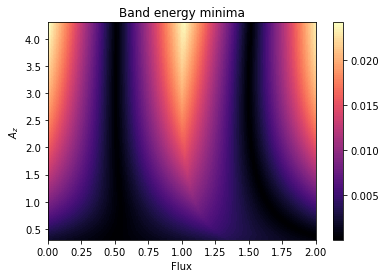

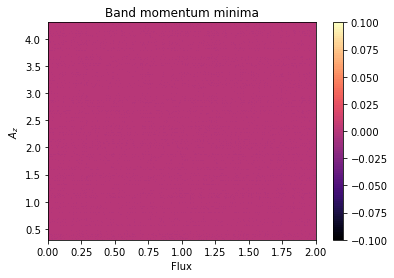

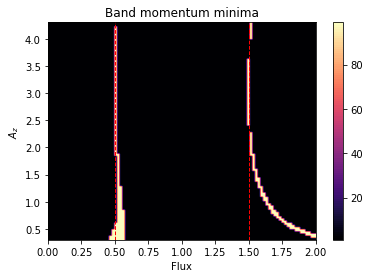

In [21]:
Z=np.ones((len(flux_arr),len(Az_arr)))
Z_k=np.ones((len(flux_arr),len(Az_arr)))
Z_0=np.ones((len(flux_arr),len(Az_arr)))
import matplotlib as mpl
import matplotlib.pyplot as plt
for i in range(len(flux_arr)):
    for j in range(len(Az_arr)):
        Z[j,i]=en_arr[i,j,argrelextrema(en_arr[i,j,:,0],np.less),0][0]
        Z_k[j,i]=momenta[argrelextrema(en_arr[i,j,:,0],np.less)[0][0]]
        if en_arr[i,j,argrelextrema(en_arr[i,j,:,0],np.less),0][0]<0.0003:
            Z_0[j,i]=99

cbar = mpl.cm.get_cmap("magma", 100)
plt.imshow(Z, aspect = 'auto',extent = [min(flux_arr), max(flux_arr), min(Az_arr),max(Az_arr)], 
           origin='lower',cmap=cbar)
plt.xlabel('Flux')
plt.ylabel('$A_z$')
plt.title('Band energy minima')
plt.colorbar()
plt.show()
plt.imshow(Z_k, aspect = 'auto',extent = [min(flux_arr), max(flux_arr), min(Az_arr),max(Az_arr)], 
           origin='lower',cmap=cbar)
plt.xlabel('Flux')
plt.ylabel('$A_z$')
plt.title('Band momentum minima')
plt.colorbar()
plt.show()
#would have expected momenta to change?
plt.imshow(Z_0, aspect = 'auto',extent = [min(flux_arr), max(flux_arr), min(Az_arr),max(Az_arr)], 
           origin='lower',cmap=cbar)
plt.xlabel('Flux')
plt.ylabel('$A_z$')
plt.title('Band momentum minima')
plt.colorbar()
plt.axvline(0.5,color='r',linestyle='--',linewidth=1)
plt.axvline(1.5,color='r',linestyle='--',linewidth=1)

plt.show()

3.9


C:\Users\hht18\AppData\Local\Temp\ipykernel_13364\3356135401.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_13364\3356135401.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_13364\3356135401.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see

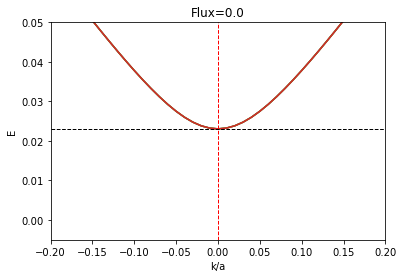

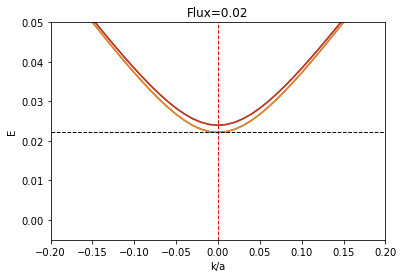

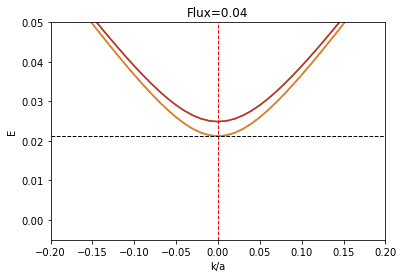

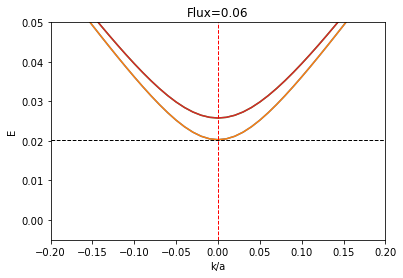

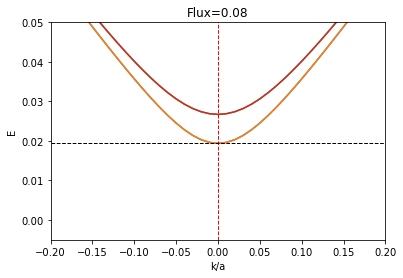

...

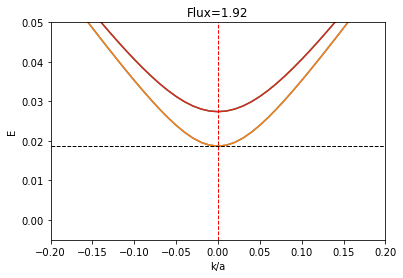

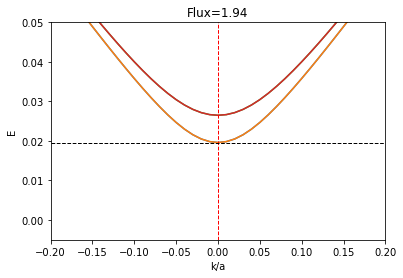

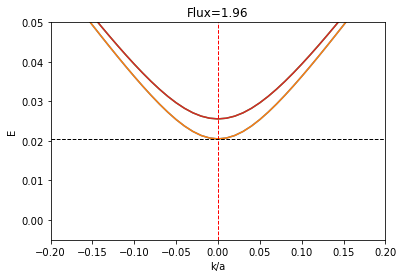

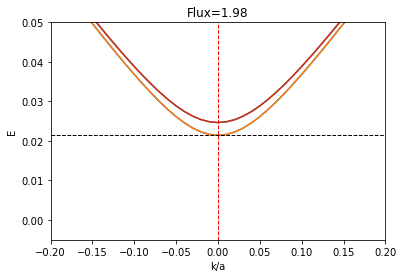

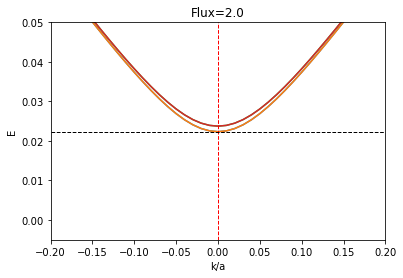

In [91]:
Az_arr=np.linspace(0.3,4.3,101)
flux_arr=np.linspace(0,2,101)
momenta=np.linspace(-0.3,0.3,61)
saved_bands=15
j=90
print(Az_arr[j])
for i in range(len(flux_arr)):
    minima=argrelextrema(en_arr[i,j,:,0],np.less)[0]

    ymin=en_arr[i,j,minima,0]
    minima=momenta[minima]
    plt.figure()
    plt.plot(momenta,en_arr[i,j,:,:])

    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.xlim(-0.2,0.2)
    plt.ylim(-0.005,0.05)
    plt.title('Flux=%s'%(round(flux_arr[i],3)))
    for k in minima:
        plt.axvline(k,linestyle='--',linewidth=1,color='r')
    for k in ymin:
        plt.axhline(k,linestyle='--',linewidth=1,color='k')


0.3


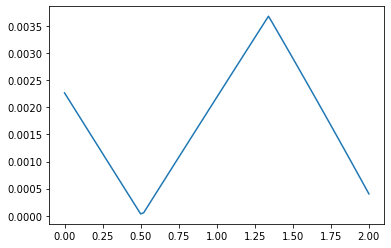

In [99]:
#toy model periodicity
j=
Az_arr[j] #3.02, closest to model params. find periodicity
mins=[]
print(Az_arr[j])
for i in range(len(flux_arr)):
    minima=argrelextrema(en_arr[i,j,:,0],np.less)[0]
    mins.append(en_arr[i,j,minima,0])
plt.figure()
plt.plot(flux_arr,mins)

# High Res induced gap against flux plot

In [6]:
'''
mu = 0.02
Delta = 0.01
phi = 0.
flux_arr=np.linspace(0,1,201)
arr_ind = int(os.environ['PBS_ARRAY_INDEX'])
saved_bands=5
save=[]
filename='3dti_inducedgap_against_flux'
counter=0
jobs=24
perjob=len(flux_arr)//jobs+1
for i in range(len(flux_arr)):
    counter+=1
    if (arr_ind*perjob)<counter<=((arr_ind+1)*perjob):
        params_bands.update(
            mu = mu,
            B_x = flux_arr[i]/W_y/T_z,
            Deltaf_L = lambda y, z: Delta if z==T_z else 0,
            Deltaf_R = lambda y, z: Delta*np.exp(1j*phi) if z==T_z else 0,
            )
        
        bands=kwant.physics.dispersion.Bands(fsyst.leads[0],params=params_bands)
        momenta=np.linspace(-0.5,0.5,121)
        en=np.array([bands(k) for k in momenta])
        lngth=en.shape[1]
        save_index=int(lngth/2)
        save.append([i,en[:,save_index:save_index+saved_bands]])
        print(i)
        pickle.dump(save,open('./inducedhres/'+filename+'%s'%(arr_ind),'wb'))
'''
#load data
flux_arr=np.linspace(0,1,201)
momenta=np.linspace(-0.5,0.5,121)
saved_bands=5
total_jobs=23 #check from the folder
en_arr=np.ones((len(flux_arr),len(momenta),saved_bands))

for k in range(total_jobs):
    filename='./inducedhres/3dti_inducedgap_against_flux'+'%s'%(k)
    data=pickle.load(open(filename,'rb'))
    for kk in range(len(data)):
        ind,en=data[kk]
        en.shape==[121,5]
        en_arr[ind]=en
    

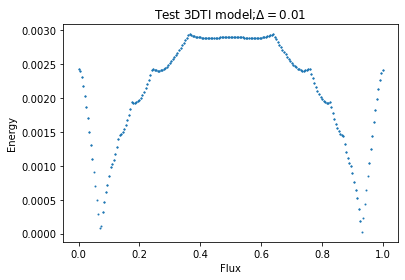

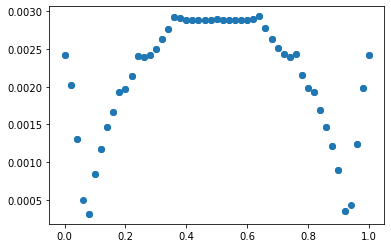

In [12]:
plt.figure()
scatx=[]
scaty=[]
for i in range(len(flux_arr)):
    minima=en_arr[i,argrelextrema(en_arr[i,:,0],np.less),0]#lowest band minima
    for j in range(len(minima[0])):
        scatx.append(flux_arr[i])
        scaty.append(minima[0][j])

plt.scatter(scatx,scaty,s=1)
plt.xlabel('Flux')
plt.ylabel('Energy')
plt.title('Test 3DTI model;$\Delta=0.01$')

plt.figure()
scatx2=[]
scaty2=[]
newflux=flux_arr[::4]
newen=en_arr[::4,:,:]
for i in range(len(newflux)):
    minima=newen[i,argrelextrema(newen[i,:,0],np.less),0]#lowest band minima
    for j in range(len(minima[0])):
        scatx2.append(flux_arr[i*4])
        scaty2.append(minima[0][j])
plt.scatter(scatx2,scaty2)
#why doesnt this look like the original graphs that we had?

C:\Users\hht18\AppData\Local\Temp\ipykernel_13364\2770916746.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_13364\2770916746.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_13364\2770916746.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

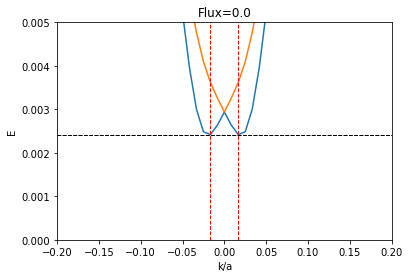

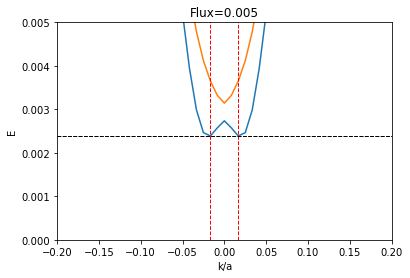

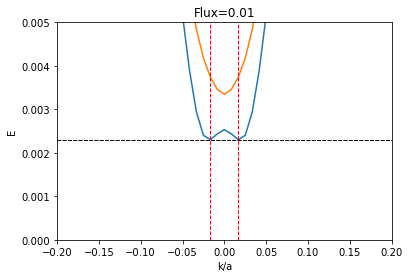

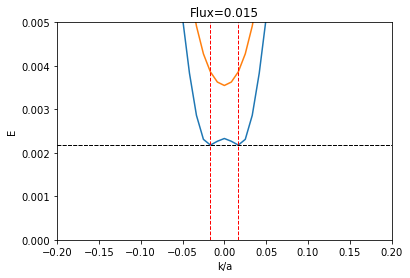

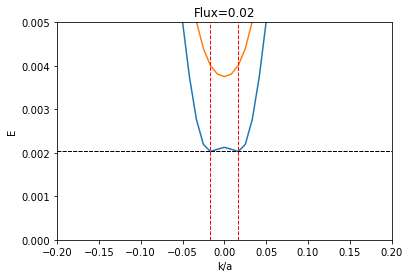

...

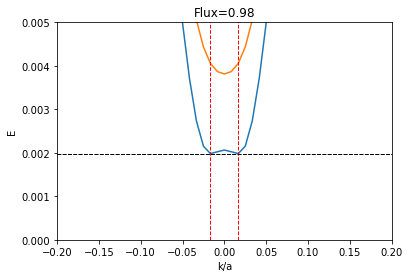

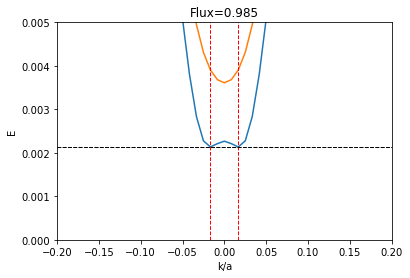

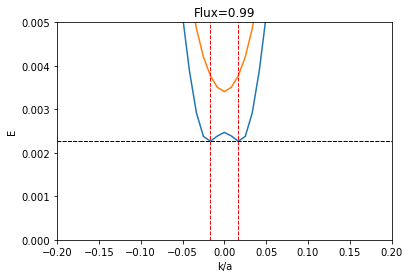

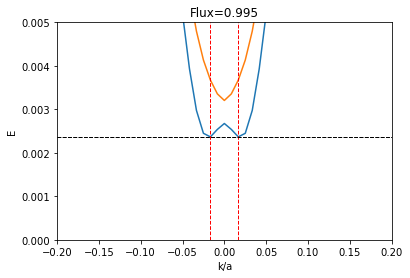

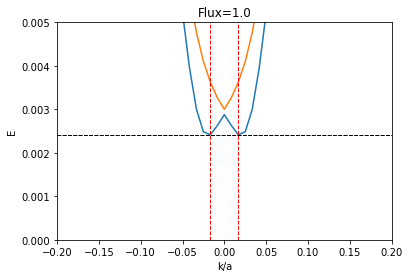

In [43]:
#try looking at the next few bands and their minima. perhaps they switch?
momenta=np.linspace(-0.5,0.5,121)

for i in range(len(flux_arr)):
    filename='./inducedhres/'+'gapplot'+'%s'%(i)
    minima=argrelextrema(en_arr[i,:,0],np.less)[0]
    ymin=en_arr[i,minima,0]
    minima=momenta[minima]
    plt.figure()
    plt.plot(momenta,en_arr[i,:,:])

    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.xlim(-0.2,0.2)
    plt.ylim(0,0.005)
    plt.title('Flux=%s'%(round(flux_arr[i],3)))
    for j in minima:
        plt.axvline(j,linestyle='--',linewidth=1,color='r')
    for j in ymin:
        plt.axhline(j,linestyle='--',linewidth=1,color='k')
    plt.savefig(filename)
    plt.close()


# Chemical Potential Investigation

In [2]:
'''
filename='high_resolution_induced_gap_plots_against_flux_chempot'
counter=0
elements=len(flux_arr)*len(mu_arr)
arr_ind = int(os.environ['PBS_ARRAY_INDEX'])
jobs=24
perjob=elements//jobs+1
save=[]
for i in range(len(flux_arr)):
    for j in range(len(mu_arr)):
        counter+=1
        if (arr_ind*perjob)<counter<=((arr_ind+1)*perjob):
            params_bands = dict(
                mu = mu_arr[j],
                B_x = flux_arr[i]/W_y/T_z,
                B_y = 0,
                Deltaf_L = lambda y, z: Delta if z==T_z else 0,
                Deltaf_R = lambda y, z: Delta*np.exp(1j*0) if z==T_z else 0,
                **f, 
                **params_3DTI,
                **params_JJ
                )
            
            bands=kwant.physics.dispersion.Bands(fsyst.leads[0],params=params_bands)
            en=np.array([bands(x) for x in momenta])
            lngth=en.shape[1]
            save_index=int(lngth/2)
            save.append([i,j,en[:,save_index:save_index+saved_bands]])

pickle.dump(save,open('./inducedgap/'+filename+'%s' % (str(arr_ind)), 'wb'))

'''
momenta=np.linspace(-0.3,0.3,61)
mu_arr=np.linspace(0.,0.1,101)
flux_arr=np.linspace(0,2,101)
saved_bands=10
print(len(flux_arr[:53]))
en_arr=np.ones((len(flux_arr[:54]),len(mu_arr),len(momenta),saved_bands)) #data was only run to 54th index on flux. Discard last one
filename='./inducedgap/high_resolution_induced_gap_plots_against_flux_chempot'
for k in range(13):
    print(k)
    data=pickle.load(open(filename+'%s'%(k),'rb')) #highest i=54, j=83
    for kk in range(len(data)):
        i,j,en=data[kk]
        if i<=53:
            en_arr[i,j,:,:]=en
print(len(data[0][2][0]))

53
0
1
2
3
4
5
6
7
8
9
10
11
12
10


0.05


C:\Users\hht18\AppData\Local\Temp\ipykernel_18028\1791728498.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_18028\1791728498.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
C:\Users\hht18\AppData\Local\Temp\ipykernel_18028\1791728498.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

IndexError: index 54 is out of bounds for axis 0 with size 54

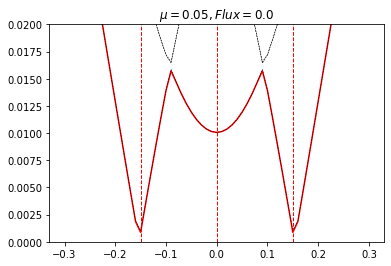

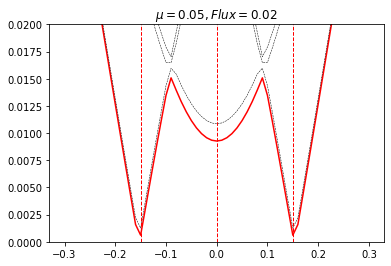

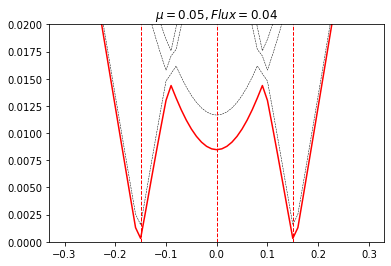

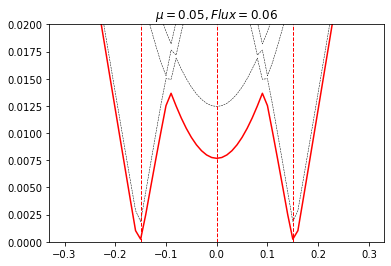

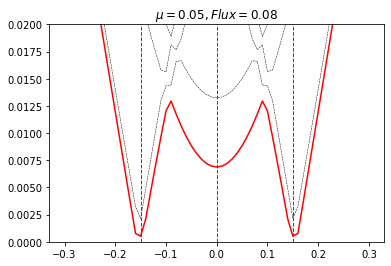

...

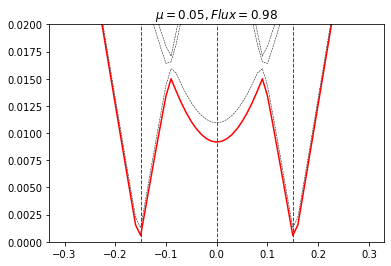

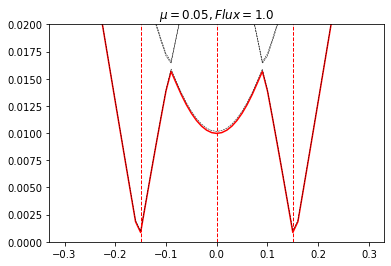

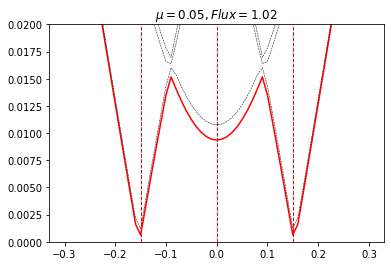

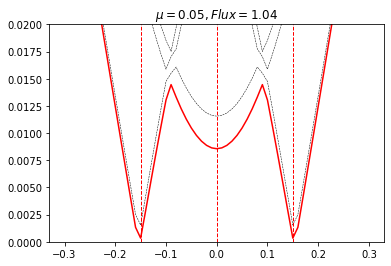

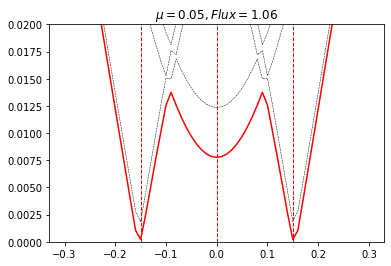

<Figure size 432x288 with 0 Axes>

In [6]:

kk=50
print(mu_arr[kk])
for k in range(len(flux_arr)):
    plt.figure()
    plt.plot(momenta,en_arr[k,kk,:,0],color='r')
    plt.plot(momenta,en_arr[k,kk,:,1:],color='k',linestyle='--',linewidth=0.5)
    plt.ylim(0,0.02)
    for i in argrelextrema(en_arr[k,kk,:,0],np.less)[0]:
        plt.axvline(momenta[i],linestyle='--',color='r',linewidth=1)
    plt.title('$\mu=%s,Flux=%s$'%(mu_arr[kk],flux_arr[k]))
    argrelextrema(en_arr[-25,-1,:,0],np.less)[0],en_arr[25,-1,argrelextrema(en_arr[-25,-1,:,0],np.less)[0],0]
    #minima is no longer at 0, might be worth it to plot it out in 2D
    #print(flux_arr[k],mu_arr[kk])

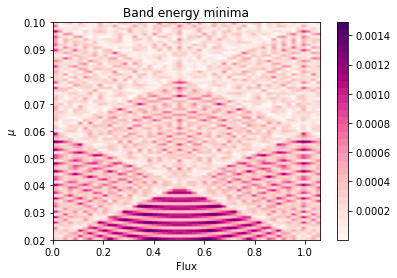

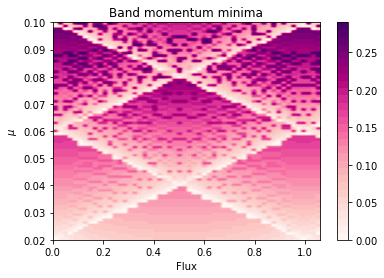

In [64]:
mustart=20
Z=np.ones((len(mu_arr)-mustart,len(flux_arr[:54])))
Z_k=np.ones((len(mu_arr)-mustart,len(flux_arr[:54])))
import matplotlib as mpl
import matplotlib.pyplot as plt
for i in range(len(flux_arr[:54])):
    for j in range(mustart,len(mu_arr)):
        minima=argrelextrema(en_arr[i,j,:,0],np.less)[0]
        if len(minima)==1:
            Z[j-mustart,i]=en_arr[i,j,minima[0],0]
            Z_k[j-mustart,i]=np.abs(momenta[minima[0]])
        else:
            ens=en_arr[i,j,minima,0]
            min2=np.argmin(ens) #takes first minima NOTE: ONLY WORKS WITH +ve VALUES
            minindex=minima[min2]
            
            Z[j-mustart,i]=en_arr[i,j,minindex,0]
            Z_k[j-mustart,i]=np.abs(momenta[minindex]) #just taking +ve value
            
cbar = mpl.cm.get_cmap("RdPu", 30)
plt.imshow(Z, aspect = 'auto',extent = [min(flux_arr[:54]), max(flux_arr[:54]),  min(mu_arr[20:]),max(mu_arr[20:])],
           cmap=cbar,origin='lower')
plt.xlabel('Flux')
plt.ylabel('$\mu$')
plt.title('Band energy minima')
plt.colorbar()
plt.savefig('./inducedgap/chempotvsflux_E')
plt.show()

plt.imshow(Z_k, aspect = 'auto',extent = [min(flux_arr[:54]), max(flux_arr[:54]),  min(mu_arr[20:]),max(mu_arr[20:])],
           cmap=cbar,origin='lower')
plt.xlabel('Flux')
plt.ylabel('$\mu$')
plt.title('Band momentum minima')
plt.colorbar()
plt.savefig('./inducedgap/chempotvsflux_k')
plt.show()
#would have expected momenta to change?


In [ ]:
k=25 #half flux
kk=50
print(flux_arr[k],mu_arr[kk])
for kk in range(len(mu_arr)):
    plt.figure()
    plt.plot(momenta,en_arr[k,kk,:,0])
    plt.ylim(0,0.01)
    for i in argrelextrema(en_arr[k,kk,:,0],np.less)[0]:
        plt.axvline(momenta[i],linestyle='--',color='r',linewidth=1)
    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.title(r'$\mu=%s,\Phi=%s$'%(round(mu_arr[kk],3),round(flux_arr[k],3)))
    plt.savefig('./inducedgap/halflfuxbandplots%s'%(kk))
    plt.close()


# Half flux, changing mu; higher res

In [2]:
'''
mu_arr=np.arange(0.02,0.1205,0.0005) 
Delta = 0.001
flux_arr=[0.5]
momenta=np.linspace(-1.,1.,2001)
saved_bands=1 

### Induced gap against flux, chemical potential. Use to get detailed plot, and
### to plot 2d graph of induced gap against chemical potential
filename='halfflux_chempot'
counter=0
elements=len(flux_arr)*len(mu_arr)
arr_ind = int(os.environ['PBS_ARRAY_INDEX'])
jobs=24
perjob=elements//jobs+1
save=[]
for i in range(len(flux_arr)):
    for j in range(len(mu_arr)):
        counter+=1
        if (arr_ind*perjob)<counter<=((arr_ind+1)*perjob):
            params_bands = dict(
                mu = mu_arr[j],
                B_x = flux_arr[i]/W_y/T_z,
                B_y = 0,
                Deltaf_L = lambda y, z: Delta if z==T_z else 0,
                Deltaf_R = lambda y, z: Delta*np.exp(1j*0) if z==T_z else 0,
                **f, 
                **params_3DTI,
                **params_JJ
                )
            
            bands=kwant.physics.dispersion.Bands(fsyst.leads[0],params=params_bands)
            en=np.array([bands(x) for x in momenta])
            lngth=en.shape[1]
            save_index=int(lngth/2)
            save.append([i,j,en[:,save_index:save_index+saved_bands]])

pickle.dump(save,open('./inducedgap/'+filename+'%s' % (str(arr_ind)), 'wb'))
'''
mu_arr=np.arange(0.02,0.1205,0.0005) 
Delta = 0.001
flux_arr=[0.5]
momenta=np.linspace(-1.,1.,2001)
saved_bands=1 

en_arr=np.ones((len(flux_arr),len(mu_arr),len(momenta),saved_bands))

for k in range(24): #number of jobs
    filename='./inducedgap/halfflux_chempot%s'%(k)
    data=pickle.load(open(filename,'rb'))
    for kk in range(len(data)):
        i,j,en=data[kk]
        en_arr[i,j,:,:]=en

In [37]:
for kk in range(len(mu_arr)):
    plt.figure()
    minima=argrelextrema(en_arr[0,kk,:,0],np.less)[0]
    en_mins=en_arr[0,kk,argrelextrema(en_arr[0,kk,:,0],np.less)[0],0]
    mom_mins=momenta[minima]
    plt.plot(momenta,en_arr[0,kk,:,0],color='k')
    plt.ylim(0,0.001)
    plt.xlim(-.5,.5)
    
    if len(minima)%2==0: #even number of minima
        maxr=len(en_mins)//2
    else:
        maxr=(len(en_mins)-1)//2
        
    abs_en_min=np.argmin(en_mins[:maxr])

    for i in range(maxr):
        if i==abs_en_min:
            plt.axhline(en_mins[i],color='r',linewidth=.5,linestyle='--')
            plt.axvline(mom_mins[i],color='r',linewidth=1,linestyle='--',
                        label='$E/\Delta$=%s, k=$\pm$%s global minima'%(round(en_mins[i]/.001,3),abs(round(mom_mins[i],3))))
            plt.axvline(-mom_mins[i],color='r',linewidth=1,linestyle='--')
        else:
            plt.axvline(mom_mins[i],color='k',linewidth=.5,linestyle='--')
            plt.axvline(-mom_mins[i],color='k',linewidth=.5,linestyle='--')
    
        
        
    plt.xlabel('k/a')
    plt.ylabel('E')
    plt.title(r'$\mu=%s,\Phi=%s$'%(round(mu_arr[kk],3),round(flux_arr[0],3)))
    plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
    plt.savefig('./inducedgap/halfflux_chempot_gif%s'%(kk),bbox_inches='tight')
    plt.close()

<Figure size 432x288 with 0 Axes>

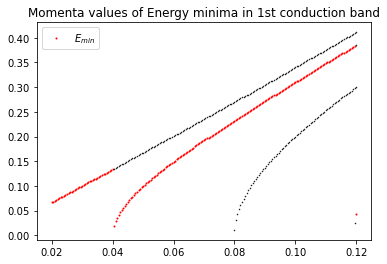

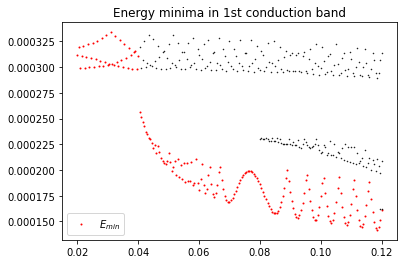

In [52]:
plt.figure()
y=[]
other_y=[]
other_x=[] #for the multiple minima
en_y=[]
other_eny=[]
for kk in range(len(mu_arr)):
    minima=argrelextrema(en_arr[0,kk,:,0],np.less)[0]
    en_mins=en_arr[0,kk,argrelextrema(en_arr[0,kk,:,0],np.less)[0],0]
    mom_mins=momenta[minima]

    if len(minima)%2==0: #even number of minima
        maxr=len(en_mins)//2
    else:
        maxr=(len(en_mins)-1)//2
    abs_en_min=np.argmin(en_mins[:maxr])
    
    for i in range(maxr):
        if i==abs_en_min:
            y.append(abs(mom_mins[abs_en_min])) #just plot +ve value
            en_y.append(en_mins[abs_en_min])
        else:
            other_y.append(abs(mom_mins[i]))
            other_eny.append(en_mins[i])
            other_x.append(mu_arr[kk])
plt.figure()
plt.plot(mu_arr,y,'.',color='r',label=r'$E_{min}$',markersize=2)
plt.plot(other_x,other_y,'.',color='k',markersize=1)
plt.title('Momenta values of Energy minima in 1st conduction band')
plt.legend()
plt.savefig('./inducedgap/halffluxmomentaplot')

plt.figure()
plt.plot(mu_arr,en_y,'.',color='r',label=r'$E_{min}$',markersize=2)
plt.plot(other_x,other_eny,'.',color='k',markersize=1)
plt.title('Energy minima in 1st conduction band')
plt.legend()
plt.savefig('./inducedgap/halffluxenergyplot')

# Multichannel

In [14]:
#checking if we are in multichannel regime
syst,params=make_3dti(Delta=0.001,mu=0.3)
mom=np.linspace(-np.pi,np.pi,6001)
bands=kwant.physics.dispersion.Bands(syst.leads[0],params=params)
en=np.array([bands(x) for x in mom])

plt.figure()
plt.plot(mom,en[:,0])
plt.ylim(0.,.3) #we actually see 0.1 only has like 3 channels... not very good.
for i in np.arange(0.12,0.31,0.02):
    plt.axhline(i)
    print(i)
plt.show()
#plt.xlim(-.3,.3)

syst,params=make_3dti()
mom=np.linspace(-1.5,1.5,121)
bands=kwant.physics.dispersion.Bands(syst.leads[0],params=params)
en=np.array([bands(x) for x in mom])

plt.figure()
plt.plot(mom,en)
plt.ylim(0.,.3) #we actually see 0.1 only has like 3 channels... not very good.
for i in np.arange(0.12,0.31,0.02):
    plt.axhline(i)
    print(i)
plt.show()

KeyboardInterrupt: 

In [2]:
'''
mu_arr=np.arange(0.02,0.31,0.02) #up to 0.1 has already been done
Delta = 0.001
flux_arr=np.linspace(0,2,101)
momenta=np.linspace(-1.5,1.5,121)
saved_bands=30 #just save like 10 bands, should be enough

### Induced gap against flux, chemical potential. Use to get detailed plot, and
### to plot 2d graph of induced gap against chemical potential
filename='high_resolution_induced_gap_plots_against_flux_chempot_expandedmom_morechannels'
counter=0
elements=len(flux_arr)*len(mu_arr)
arr_ind = int(os.environ['PBS_ARRAY_INDEX'])
jobs=24
perjob=elements//jobs+1
save=[]
for i in range(len(flux_arr)):
    for j in range(len(mu_arr)):
        counter+=1
        if (arr_ind*perjob)<counter<=((arr_ind+1)*perjob):
            params_bands = dict(
                mu = mu_arr[j],
                B_x = flux_arr[i]/W_y/T_z,
                B_y = 0,
                Deltaf_L = lambda y, z: Delta if z==T_z else 0,
                Deltaf_R = lambda y, z: Delta*np.exp(1j*0) if z==T_z else 0,
                **f, 
                **params_3DTI,
                **params_JJ
                )
            
            bands=kwant.physics.dispersion.Bands(fsyst.leads[0],params=params_bands)
            en=np.array([bands(x) for x in momenta])
            lngth=en.shape[1]
            save_index=int(lngth/2)
            save.append([i,j,en[:,save_index:save_index+saved_bands]])

pickle.dump(save,open('./inducedgap/'+filename+'%s' % (str(arr_ind)), 'wb'))
'''
mu_arr=np.arange(0.02,0.31,0.02) #up to 0.1 has already been done
Delta = 0.001
flux_arr=np.linspace(0,2,101)
momenta=np.linspace(-1.5,1.5,121)
saved_bands=30 #just save like 10 bands, should be enough

en_arr=np.ones((len(flux_arr),len(mu_arr),len(momenta),saved_bands))

for k in range(24): #number of jobs
    filename='./inducedgap/high_resolution_induced_gap_plots_against_flux_chempot_expandedmom_morechannels%s'%(k)
    data=pickle.load(open(filename,'rb'))
    for kk in range(len(data)):
        i,j,en=data[kk]
        en_arr[i,j,:,:]=en

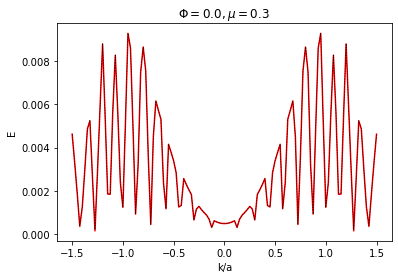

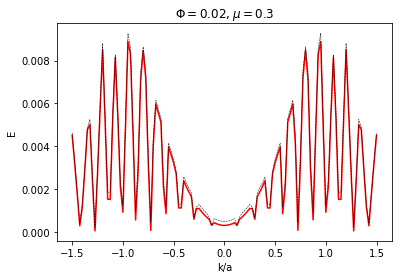

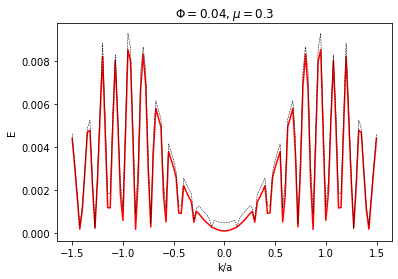

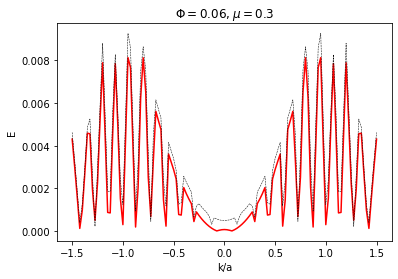

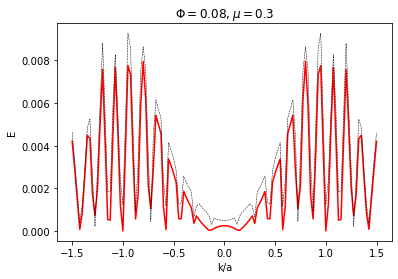

...

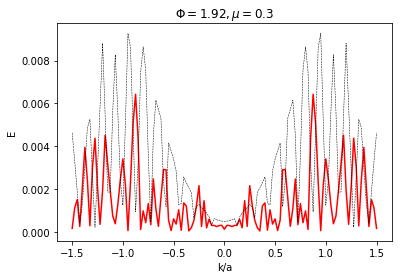

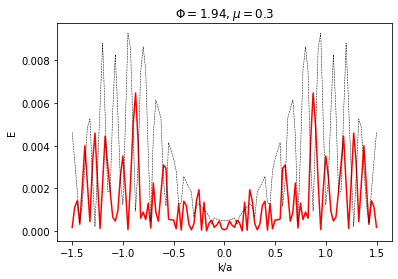

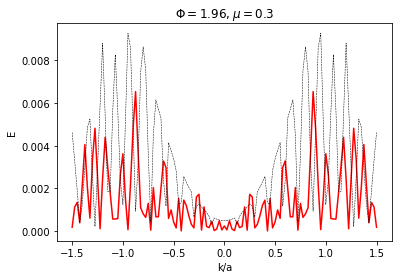

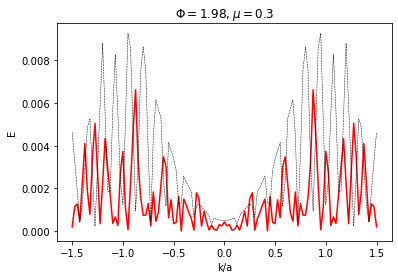

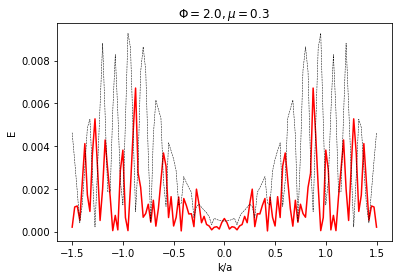

In [10]:
mu_ind=-1 #highest chemicalpotential before going into bulk
for i in range(len(flux_arr)):
    plt.figure()
    plt.ylabel('E')
    plt.plot(momenta,en_arr[i,mu_ind,:,0],'r')
    plt.plot(momenta,en_arr[0,mu_ind,:,1],'--',color='k',linewidth=.5)
    plt.xlabel('k/a')
    plt.title(r'$\Phi=%s,\mu=%s$'%(round(flux_arr[i],3),round(mu_arr[mu_ind],3)))
    plt.savefig()
    plt.show()

In [58]:
filename='./inducedgap/high_resolution_induced_gap_plots_against_flux_chempot_expandedmom_morechannels_016mu'
filename2='./inducedgap/high_resolution_induced_gap_plots_against_flux_chempot_expandedmom_morechannels_just03mu'
ex_fname2='./inducedgap/high_resolution_induced_gap_plots_against_flux_chempot_expandedmom_morechannels_just03muextra'
ex_fname=''
mu_arr=[.16,.3]
delta=.001
flux_arr=np.linspace(0,1,101)
momenta=np.linspace(-1.5,1.5,3001)
saved_bands=5
en_arr=np.ones((len(flux_arr),len(mu_arr),len(momenta),saved_bands))

range1=[0,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
range2=[0,2,3,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]

iarr=[]
iarr2=[]
for i in range1:
    curr_file=filename+'%s'%(i)
    data=pickle.load(open(filename+'%s'%(i),'rb'))
    for kk in range(len(data)):
        j,_,en=data[kk]
        en_arr[j,0,:,:]=en
        iarr.append(j)
        
for i in range2:
    curr_file=filename2+'%s'%(i)
    data=pickle.load(open(filename2+'%s'%(i),'rb'))
    for kk in range(len(data)):
        j,_,en=data[kk]
        en_arr[j,1,:,:]=en
        iarr2.append(j)
        
for i in range(15):
    curr_file=ex_fname2+'%s'%(i)
    data=pickle.load(open(curr_file,'rb'))
    
    for kk in range(len(data)):
        j,_,en=data[kk]
        en_arr[j,1,:,:]=en
        iarr2.append(j)


In [25]:
for k in range(len(flux_arr)):
    if k in iarr:
        plt.figure()
        plt.ylabel('E')
        plt.plot(momenta,en_arr[k,0,:,0],'r')
        plt.plot(momenta,en_arr[k,0,:,1:],'--',color='k',linewidth=.5)
        plt.xlabel('k/a')
        plt.title(r'$\Phi=%s,\mu=%s$'%(round(flux_arr[k],3),round(mu_arr[0],3)))
        plt.xlim(-1,1)
        plt.ylim(0,0.04)
        plt.savefig('016mu%s'%(k), dpi=300)
        plt.close()

In [17]:
plt.rcParams.update({'font.size': 18})
for k in range(len(flux_arr)):
    if k in iarr2:
        plt.figure()
        plt.ylabel('E')
        plt.plot(momenta,en_arr[k,1,:,0],'r')
        plt.plot(momenta,en_arr[k,1,:,1:],'--',color='k',linewidth=.5)
        plt.xlabel('k/a')
        plt.title(r'$\Phi=%s,\mu=%s$'%(round(flux_arr[k],3),round(mu_arr[1],3)))
        plt.ylim(0,0.03)
        #plt.ylim(0,0.04)
        plt.savefig('03mu%s'%(k), dpi=300)
        plt.close()
        


<Figure size 432x288 with 0 Axes>

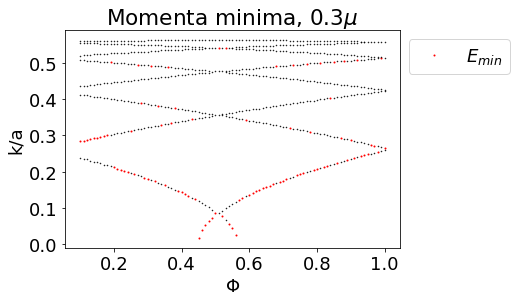

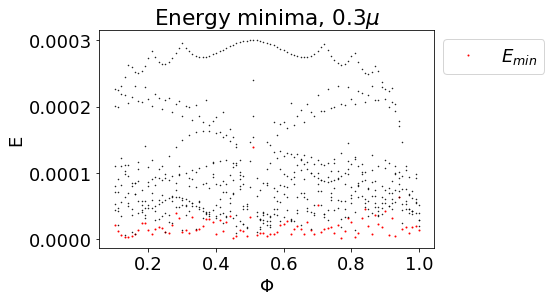

[2.1099815620281077e-05, 1.177851884239595e-05, 5.522172454427041e-06, 2.929312469876365e-06, 3.090949138756127e-06, 4.05206378152348e-06, 7.564956705108826e-06, 1.4284615296174814e-05, 2.3919874364740586e-05, 2.4061719057364536e-05, 1.3147916146573172e-05, 8.256930985090167e-06, 1.5028117256071629e-05, 1.8439853094176854e-05, 1.6899739342510983e-05, 1.0758937301336209e-05, 9.263998197206608e-06, 2.1012128423183615e-05, 3.9846936170801386e-05, 3.138491516599707e-05, 1.0215769310110973e-05, 1.4108192135683805e-05, 9.217830780259521e-06, 3.370355810752663e-05, 1.4220519831612115e-05, 1.5378778178578966e-05, 2.0045081260841984e-05, 3.0186686033559478e-05, 3.0871705822996935e-05, 2.602294723590171e-05, 8.075526629557672e-06, 2.88807193329082e-05, 1.2022624555492341e-05, 2.598832144123885e-05, 3.4532452668040104e-05, 1.7797055194632473e-06, 4.080392992302715e-06, 1.4083484736392517e-05, 1.2714285447263962e-05, 4.157764976632111e-06, 3.34086788770185e-05, 0.00013870203980692969, 5.4805500081

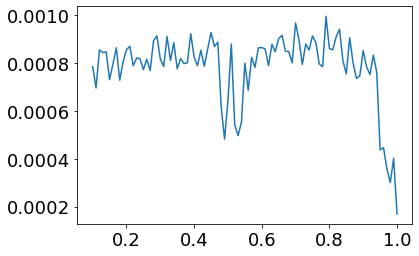

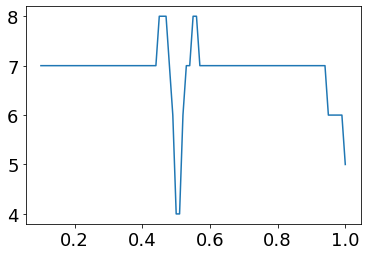

In [72]:
#counting induced gaps
Delta=0.001
plt.figure()
bandno=0 #looking at lowest band
muno=0 #looking at 0.3 mu
y=[]
other_y=[]
other_x=[] #for the multiple minima
en_y=[]
other_eny=[]
for kk in range(10,len(flux_arr)):
    minima=argrelextrema(en_arr[kk,muno,:,bandno],np.less)[0]
    en_mins=en_arr[kk,muno,argrelextrema(en_arr[kk,muno,:,bandno],np.less)[0],0]
    mom_mins=momenta[minima]
    if len(minima)%2==0: #even number of minima
        maxr=len(en_mins)//2
    else:
        maxr=(len(en_mins)-1)//2
    abs_en_min=np.argmin(en_mins[:maxr])

    for i in range(maxr):
        if i==abs_en_min:
            y.append(abs(mom_mins[abs_en_min])) #just plot +ve value
            en_y.append(en_mins[abs_en_min])
        else:
            other_y.append(abs(mom_mins[i]))
            other_eny.append(en_mins[i])
            other_x.append(flux_arr[kk])

totalx=other_x+[i for i in flux_arr[10:]]
totaly=other_eny+y
plt.figure()
plt.plot(flux_arr[10:],y,'.',color='r',label=r'$E_{min}$',markersize=2)
plt.plot(other_x,other_y,'.',color='k',markersize=1)
plt.xlabel('$\Phi$')
plt.ylabel('k/a')
plt.title('Momenta minima, 0.3$\mu$')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
plt.show()
#plt.savefig('./inducedgap/halffluxmomentaplot')

plt.figure()
plt.plot(flux_arr[10:],en_y,'.',color='r',label=r'$E_{min}$',markersize=2)
plt.plot(other_x,other_eny,'.',color='k',markersize=1)
plt.title('Energy minima, 0.3$\mu$')
plt.xlabel('$\Phi$')
plt.ylabel('E')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')
#plt.savefig('./inducedgap/halffluxenergyplot')
plt.show()

#calculate Ej
Ej=np.ones(len(flux_arr[10:]))
totalx=np.array(totalx)
totaly=np.array(totaly)
totalx=totalx[totaly<=Delta]
totaly=totaly[totaly<=Delta]
for i in range(len(Ej)):
    flux=flux_arr[10:][i]
    sortkey=totalx==flux
    abcd=np.sum(totaly[sortkey])
    Ej[i]=abcd
plt.figure()
plt.plot(flux_arr[10:],Ej)
print(en_y)

minim_count=np.ones(len(flux_arr[10:]))
plt.figure()
for i in range(len(Ej)):
    flux=flux_arr[10:][i]
    sortkey=totalx==flux
    defg=len(totaly[sortkey])
    minim_count[i]=defg
plt.plot(flux_arr[10:],minim_count)